In [ ]:
# prompt: Mount Google drive

from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import os
from tqdm import tqdm

In [ ]:
# Load the dataset
df_1896_2022 = pd.read_csv('/content/drive/MyDrive/ML files/1896-2022.csv')
df_2024 = pd.read_csv('/content/drive/MyDrive/ML files/2024.csv')
pd.set_option('display.max_rows', None)  # Shows all rows
pd.set_option('display.max_columns', None)  # Shows all columns

In [ ]:
df_1896_2022.head()

,Gender,Age,Height,Weight,NOC,Year,Season,Host_City,Events,Medal
0,Male,20.0,NaN,NaN,GER,1896.0,Summer,Athens,"Athletics Pole Vault, Men (Olympic)",NaN
1,Male,21.0,NaN,NaN,USA,1896.0,Summer,Athens,"Athletics 110 metres Hurdles, Men (Olympic)",NaN
2,Male,21.0,NaN,NaN,USA,1896.0,Summer,Athens,"Athletics Pole Vault, Men (Olympic)",Gold
3,Male,NaN,NaN,NaN,GRE,1896.0,Summer,Athens,"Cycling Road (Cycling) 333⅓ metres Time Trial,...",Silver
4,Male,NaN,NaN,NaN,GRE,1896.0,Summer,Athens,"Cycling Road (Cycling) Sprint, Men (Olympic)",Silver


In [ ]:
df_2024.head()

,Gender,Age,Height,Weight,NOC,Year,Season,Host_City,Events,Medal
0,Male,33,NaN,NaN,ARM,2024,Summer,Paris,Wrestling Men's Greco-Roman 97kg,Silver
1,Male,25,NaN,NaN,ARM,2024,Summer,Paris,Wrestling Men's Greco-Roman 77kg,Bronze
2,Male,28,NaN,NaN,ARM,2024,Summer,Paris,Wrestling Men's Greco-Roman 67kg,NaN
3,Male,25,NaN,NaN,ARM,2024,Summer,Paris,Wrestling Men's Freestyle 57kg,NaN
4,Male,25,NaN,NaN,ARM,2024,Summer,Paris,Wrestling Men's Freestyle 65kg,NaN


In [ ]:
# prompt: Merge df_1896_2022 and df_2024 into a new table called df

import pandas as pd
df = pd.concat([df_1896_2022, df_2024], ignore_index=True)


In [ ]:
df.head()

,Gender,Age,Height,Weight,NOC,Year,Season,Host_City,Events,Medal
0,Male,20.0,NaN,NaN,GER,1896.0,Summer,Athens,"Athletics Pole Vault, Men (Olympic)",NaN
1,Male,21.0,NaN,NaN,USA,1896.0,Summer,Athens,"Athletics 110 metres Hurdles, Men (Olympic)",NaN
2,Male,21.0,NaN,NaN,USA,1896.0,Summer,Athens,"Athletics Pole Vault, Men (Olympic)",Gold
3,Male,NaN,NaN,NaN,GRE,1896.0,Summer,Athens,"Cycling Road (Cycling) 333⅓ metres Time Trial,...",Silver
4,Male,NaN,NaN,NaN,GRE,1896.0,Summer,Athens,"Cycling Road (Cycling) Sprint, Men (Olympic)",Silver


In [ ]:
# prompt: sort df in ascending order according to year

df_sorted = df.sort_values('Year', ascending=True)
df_sorted.head()


,Gender,Age,Height,Weight,NOC,Year,Season,Host_City,Events,Medal
0,Male,20.0,NaN,NaN,GER,1896.0,Summer,Athens,"Athletics Pole Vault, Men (Olympic)",NaN
206,Male,30.0,NaN,NaN,DEN,1896.0,Summer,Athens,"Athletics 500 metres Freestyle, Men (Olympic)",NaN
205,Male,24.0,NaN,NaN,AUT,1896.0,Summer,Athens,"Fencing 12-Hours Race, Men (Olympic)",Gold
204,Male,30.0,NaN,NaN,DEN,1896.0,Summer,Athens,"Athletics 1,200 metres Freestyle, Men (Olympic)",NaN
203,Male,24.0,NaN,NaN,AUT,1896.0,Summer,Athens,"Fencing 100 kilometres, Men (Olympic)",NaN


In [ ]:
# Check for missing values
df_sorted.isnull().sum()

,0
Gender,0
Age,832
Height,31202
Weight,37694
NOC,0
Year,183
Season,183
Host_City,183
Events,0
Medal,122393


In [ ]:
# Clean the 'Medal' column by removing leading/trailing spaces and converting to title case
df_sorted['Medal'] = df_sorted['Medal'].str.strip().str.title()

# Now display the count of each medal type again
medal_counts = df_sorted['Medal'].value_counts()
print(medal_counts)


Medal
Bronze    7506
Silver    7011
Gold      7007
Name: count, dtype: int64


In [ ]:
# Display the count of each medal type
df_sorted['Medal'].value_counts()

,count
Medal,
Bronze,7506
Silver,7011
Gold,7007


In [ ]:
# prompt: Check the count of duplicates in backup4

duplicate_count = df_sorted.duplicated().sum()
print(f"Count of duplicates in backup4: {duplicate_count}")

Count of duplicates in backup4: 0


In [ ]:
duplicates_count = df_sorted.duplicated(subset=['NOC', 'Year', 'Season', 'Host_City', 'Medal', 'Events']).sum()
print(f"The number of duplicates based on specified columns is: {duplicates_count}")

The number of duplicates based on specified columns is: 0


In [ ]:
# prompt: print the counts of the gold, silver, bronze medals of USA separately

usa_medals = df_sorted[df_sorted['NOC'] == 'USA']

gold_count = usa_medals[usa_medals['Medal'] == 'Gold'].shape[0]
silver_count = usa_medals[usa_medals['Medal'] == 'Silver'].shape[0]
bronze_count = usa_medals[usa_medals['Medal'] == 'Bronze'].shape[0]


print(f"USA Gold Medals: {gold_count}")
print(f"USA Silver Medals: {silver_count}")
print(f"USA Bronze Medals: {bronze_count}")


USA Gold Medals: 1233
USA Silver Medals: 1020
USA Bronze Medals: 879


In [ ]:
# prompt: print the counts of the gold, silver, bronze medals of CHN separately

chn_medals = df_sorted[df_sorted['NOC'] == 'CHN']

chn_gold_count = chn_medals[chn_medals['Medal'] == 'Gold'].shape[0]
chn_silver_count = chn_medals[chn_medals['Medal'] == 'Silver'].shape[0]
chn_bronze_count = chn_medals[chn_medals['Medal'] == 'Bronze'].shape[0]

print(f"CHN Gold Medals: {chn_gold_count}")
print(f"CHN Silver Medals: {chn_silver_count}")
print(f"CHN Bronze Medals: {chn_bronze_count}")


CHN Gold Medals: 324
CHN Silver Medals: 259
CHN Bronze Medals: 224


In [ ]:
backup1 = df_sorted.copy()
backup1.head()

,Gender,Age,Height,Weight,NOC,Year,Season,Host_City,Events,Medal
0,Male,20.0,NaN,NaN,GER,1896.0,Summer,Athens,"Athletics Pole Vault, Men (Olympic)",NaN
206,Male,30.0,NaN,NaN,DEN,1896.0,Summer,Athens,"Athletics 500 metres Freestyle, Men (Olympic)",NaN
205,Male,24.0,NaN,NaN,AUT,1896.0,Summer,Athens,"Fencing 12-Hours Race, Men (Olympic)",Gold
204,Male,30.0,NaN,NaN,DEN,1896.0,Summer,Athens,"Athletics 1,200 metres Freestyle, Men (Olympic)",NaN
203,Male,24.0,NaN,NaN,AUT,1896.0,Summer,Athens,"Fencing 100 kilometres, Men (Olympic)",NaN


In [ ]:
# One-hot encode the 'Medal' column
backup1 = pd.concat([backup1, pd.get_dummies(backup1['Medal'])], axis=1)

In [ ]:
backup1.head()

,Gender,Age,Height,Weight,NOC,Year,Season,Host_City,Events,Medal,Bronze,Gold,Silver
0,Male,20.0,NaN,NaN,GER,1896.0,Summer,Athens,"Athletics Pole Vault, Men (Olympic)",NaN,False,False,False
206,Male,30.0,NaN,NaN,DEN,1896.0,Summer,Athens,"Athletics 500 metres Freestyle, Men (Olympic)",NaN,False,False,False
205,Male,24.0,NaN,NaN,AUT,1896.0,Summer,Athens,"Fencing 12-Hours Race, Men (Olympic)",Gold,False,True,False
204,Male,30.0,NaN,NaN,DEN,1896.0,Summer,Athens,"Athletics 1,200 metres Freestyle, Men (Olympic)",NaN,False,False,False
203,Male,24.0,NaN,NaN,AUT,1896.0,Summer,Athens,"Fencing 100 kilometres, Men (Olympic)",NaN,False,False,False


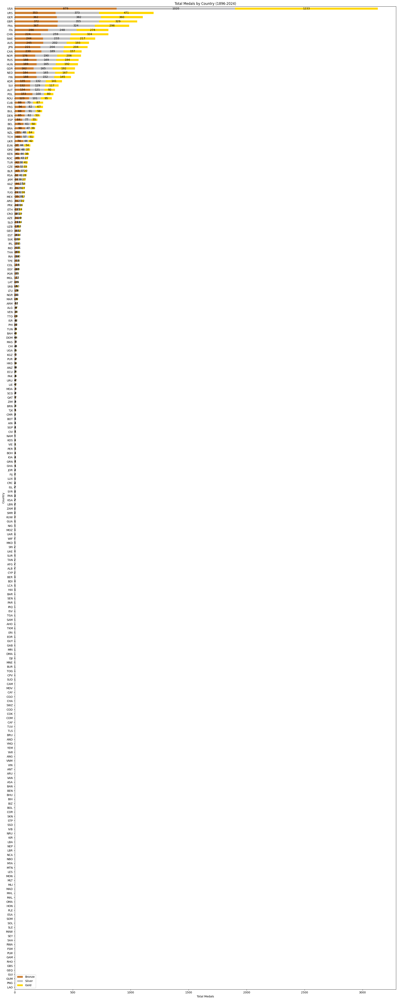

In [ ]:
import matplotlib.pyplot as plt

# Group by 'NOC' and sum the medal counts
medal_counts = backup1.groupby('NOC')[['Gold', 'Silver', 'Bronze']].sum()

# Calculate the total medals for sorting
medal_counts['Total'] = medal_counts['Gold'] + medal_counts['Silver'] + medal_counts['Bronze']

# Sort the medal counts in descending order by total medals
medal_counts = medal_counts.sort_values(by='Total', ascending=False)

# Plot the horizontal bar graph
fig, ax = plt.subplots(figsize=(20, 50))

# Plot each medal type
medal_counts[['Bronze', 'Silver', 'Gold']].plot(kind='barh', stacked=True, color=['#cd7f32', '#c0c0c0', '#ffd700'], ax=ax)

# Set labels and title
ax.set_xlabel('Total Medals')
ax.set_ylabel('Country')
ax.set_title('Total Medals by Country (1896-2024)')

# Display the total medal count on the bars
for i in ax.patches:
    # Find the position for the text
    width = i.get_width()
    if width > 0:  # Only display text for non-zero values
        ax.text(i.get_x() + width / 2, i.get_y() + i.get_height() / 2, str(int(width)),
                fontsize=10, color='black', va='center', ha='center')

# Adjust layout to prevent label overlap
plt.tight_layout()

# Invert the y-axis to display the highest medal count at the top
ax.invert_yaxis()

# Show the plot
plt.show()

In [ ]:
# Group by 'Event' and sum the medal counts
event_medal_counts = backup1.groupby('Events')[['Gold', 'Silver', 'Bronze']].sum()

# Calculate the total medals for sorting
event_medal_counts['Total'] = event_medal_counts['Gold'] + event_medal_counts['Silver'] + event_medal_counts['Bronze']

# Sort the medal counts in descending order by total medals
event_medal_counts = event_medal_counts.sort_values(by='Total', ascending=False)

# Plot the horizontal bar graph
fig, ax = plt.subplots(figsize=(35, 220))

# Plot each medal type
event_medal_counts[['Bronze', 'Silver', 'Gold']].plot(kind='barh', stacked=True, color=['#cd7f32', '#c0c0c0', '#ffd700'], ax=ax)

# Set labels and title
ax.set_xlabel('Total Medals')
ax.set_ylabel('Event')
ax.set_title('Total Medals by Event (1896-2024)')

# Display the total medal count on the bars
for i in ax.patches:
    # Find the position for the text
    width = i.get_width()
    if width > 0:  # Only display text for non-zero values
        ax.text(i.get_x() + width / 2, i.get_y() + i.get_height() / 2, str(int(width)),
                fontsize=8, color='black', va='center', ha='center')

# Adjust layout to prevent label overlap
plt.tight_layout()

# Invert the y-axis to display the highest medal count at the top
ax.invert_yaxis()

# Show the plot
plt.show()

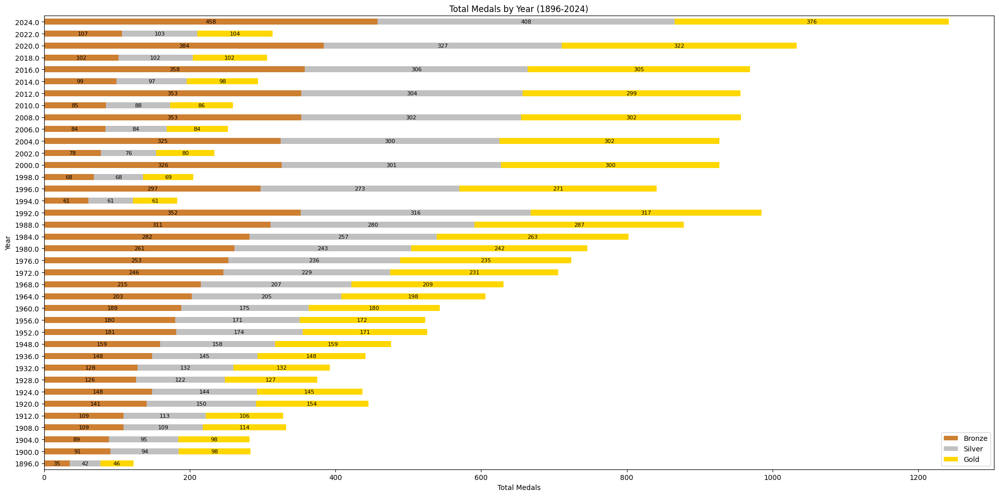

In [ ]:
# Group by 'Year' and sum the medal counts
year_medal_counts = backup1.groupby('Year')[['Gold', 'Silver', 'Bronze']].sum()

# Calculate the total medals for sorting
year_medal_counts['Total'] = year_medal_counts['Gold'] + year_medal_counts['Silver'] + year_medal_counts['Bronze']

# Sort the medal counts in descending order by total medal count
year_medal_counts = year_medal_counts.sort_values(by='Year', ascending=False)

# Plot the horizontal bar graph
fig, ax = plt.subplots(figsize=(20, 10))

# Plot each medal type
year_medal_counts[['Bronze', 'Silver', 'Gold']].plot(kind='barh', stacked=True, color=['#cd7f32', '#c0c0c0', '#ffd700'], ax=ax)

# Set labels and title
ax.set_xlabel('Total Medals')
ax.set_ylabel('Year')
ax.set_title('Total Medals by Year (1896-2024)')

# Display the total medal count on the bars
for i in ax.patches:
    # Find the position for the text
    width = i.get_width()
    if width > 0:  # Only display text for non-zero values
        ax.text(i.get_x() + width / 2, i.get_y() + i.get_height() / 2, str(int(width)),
                fontsize=8, color='black', va='center', ha='center')

# Adjust layout to prevent label overlap
plt.tight_layout()

# Invert the y-axis to display the highest medal count at the top
ax.invert_yaxis()

# Show the plot
plt.show()

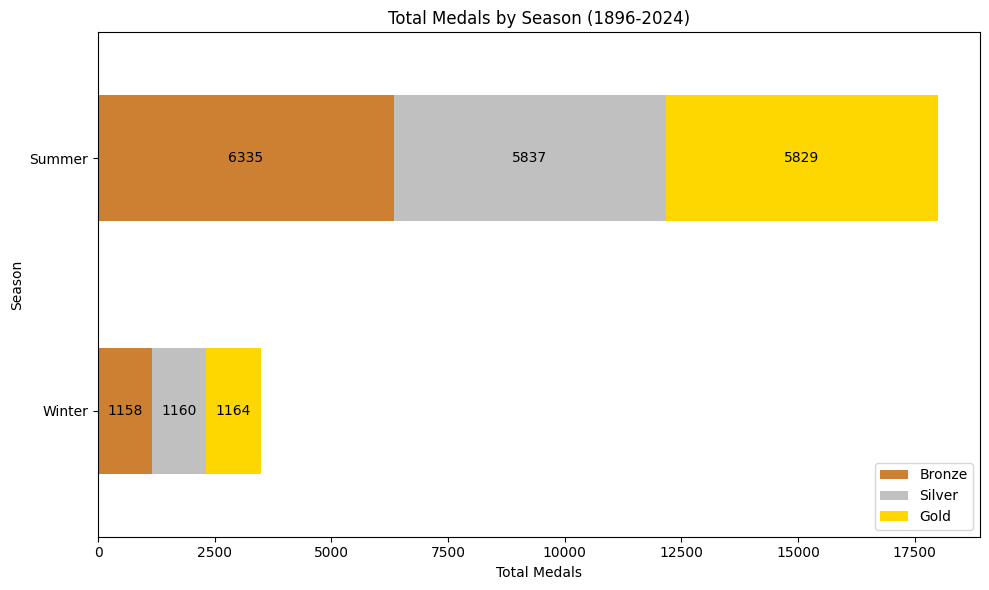

In [ ]:
# Group by 'Season' and sum the medal counts
season_medal_counts = backup1.groupby('Season')[['Gold', 'Silver', 'Bronze']].sum()

# Calculate the total medals for sorting
season_medal_counts['Total'] = season_medal_counts['Gold'] + season_medal_counts['Silver'] + season_medal_counts['Bronze']

# Sort the medal counts in descending order by total medals
season_medal_counts = season_medal_counts.sort_values(by='Total', ascending=False)

# Plot the horizontal bar graph
fig, ax = plt.subplots(figsize=(10, 6))

# Plot each medal type
season_medal_counts[['Bronze', 'Silver', 'Gold']].plot(kind='barh', stacked=True, color=['#cd7f32', '#c0c0c0', '#ffd700'], ax=ax)

# Set labels and title
ax.set_xlabel('Total Medals')
ax.set_ylabel('Season')
ax.set_title('Total Medals by Season (1896-2024)')

# Display the total medal count on the bars
for i in ax.patches:
    # Find the position for the text
    width = i.get_width()
    if width > 0:  # Only display text for non-zero values
        ax.text(i.get_x() + width / 2, i.get_y() + i.get_height() / 2, str(int(width)),
                fontsize=10, color='black', va='center', ha='center')

# Adjust layout to prevent label overlap
plt.tight_layout()

# Invert the y-axis to display the highest medal count at the top
ax.invert_yaxis()

# Show the plot
plt.show()


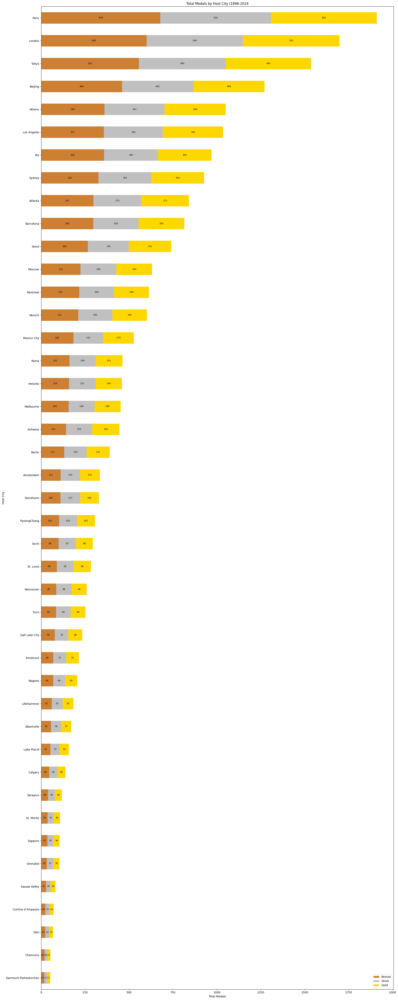

In [ ]:
# Group by 'City' and sum the medal counts
city_medal_counts = backup1.groupby('Host_City')[['Gold', 'Silver', 'Bronze']].sum()

# Calculate the total medals for sorting
city_medal_counts['Total'] = city_medal_counts['Gold'] + city_medal_counts['Silver'] + city_medal_counts['Bronze']

# Sort the medal counts in descending order by total medals
city_medal_counts = city_medal_counts.sort_values(by='Total', ascending=False)

# Plot the horizontal bar graph
fig, ax = plt.subplots(figsize=(20, 50))

# Plot each medal type
city_medal_counts[['Bronze', 'Silver', 'Gold']].plot(kind='barh', stacked=True, color=['#cd7f32', '#c0c0c0', '#ffd700'], ax=ax)

# Set labels and title
ax.set_xlabel('Total Medals')
ax.set_ylabel('Host City')
ax.set_title('Total Medals by Host City (1896-2024')

# Display the total medal count on the bars
for i in ax.patches:
    # Find the position for the text
    width = i.get_width()
    if width > 0:  # Only display text for non-zero values
        ax.text(i.get_x() + width / 2, i.get_y() + i.get_height() / 2, str(int(width)),
                fontsize=8, color='black', va='center', ha='center')

# Adjust layout to prevent label overlap
plt.tight_layout()

# Invert the y-axis to display the highest medal count at the top
ax.invert_yaxis()

# Show the plot
plt.show()

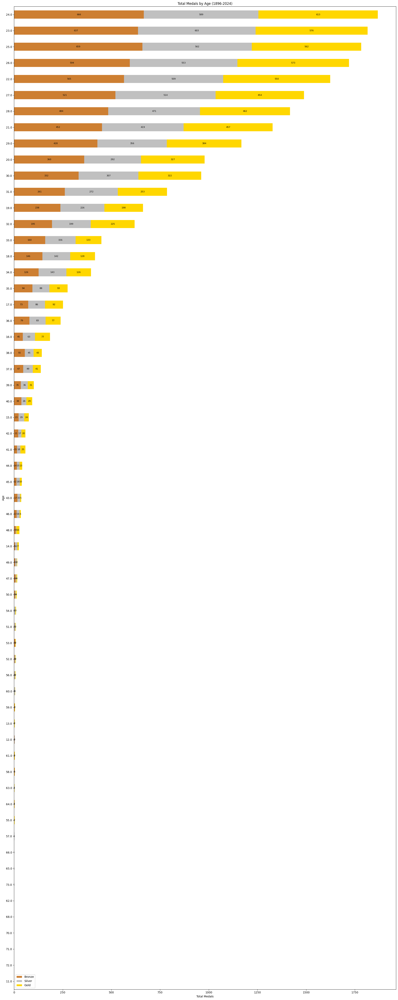

In [ ]:
# Group by 'Age' and sum the medal counts
age_medal_counts = backup1.groupby('Age')[['Gold', 'Silver', 'Bronze']].sum()

# Calculate the total medals for sorting
age_medal_counts['Total'] = age_medal_counts['Gold'] + age_medal_counts['Silver'] + age_medal_counts['Bronze']

# Sort the medal counts in ascending order by total medal count
age_medal_counts = age_medal_counts.sort_values(by='Total', ascending=False)

# Plot the horizontal bar graph
fig, ax = plt.subplots(figsize=(20, 50))

# Plot each medal type
age_medal_counts[['Bronze', 'Silver', 'Gold']].plot(kind='barh', stacked=True, color=['#cd7f32', '#c0c0c0', '#ffd700'], ax=ax)

# Set labels and title
ax.set_xlabel('Total Medals')
ax.set_ylabel('Age')
ax.set_title('Total Medals by Age (1896-2024)')

# Display the total medal count on the bars
for i in ax.patches:
    # Find the position for the text
    width = i.get_width()
    if width > 0:  # Only display text for non-zero values
        ax.text(i.get_x() + width / 2, i.get_y() + i.get_height() / 2, str(int(width)),
                fontsize=8, color='black', va='center', ha='center')

# Adjust layout to prevent label overlap
plt.tight_layout()

# Invert the y-axis to display the highest medal count at the top
ax.invert_yaxis()

# Show the plot
plt.show()

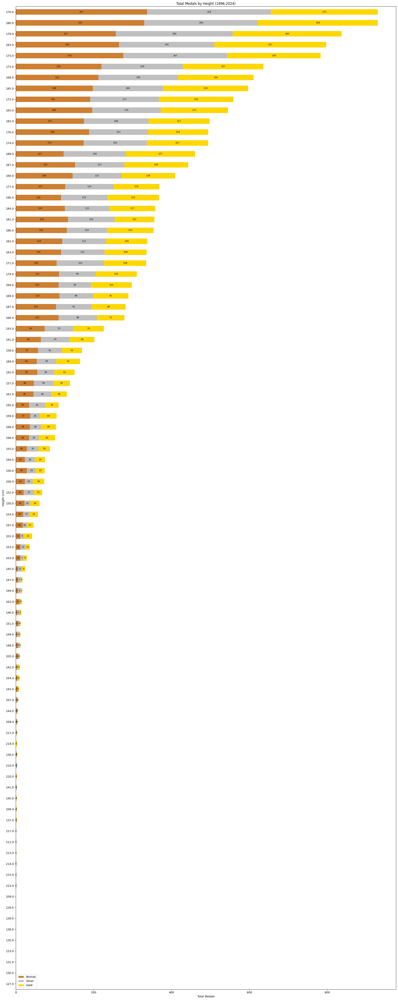

In [ ]:
# Group by 'Height' and sum the medal counts
height_medal_counts = backup1.groupby('Height')[['Gold', 'Silver', 'Bronze']].sum()

# Calculate the total medals for sorting
height_medal_counts['Total'] = height_medal_counts['Gold'] + height_medal_counts['Silver'] + height_medal_counts['Bronze']

# Sort the medal counts in ascending order by total medal count
height_medal_counts = height_medal_counts.sort_values(by='Total', ascending=False)

# Plot the horizontal bar graph
fig, ax = plt.subplots(figsize=(20, 50))

# Plot each medal type
height_medal_counts[['Bronze', 'Silver', 'Gold']].plot(kind='barh', stacked=True, color=['#cd7f32', '#c0c0c0', '#ffd700'], ax=ax)

# Set labels and title
ax.set_xlabel('Total Medals')
ax.set_ylabel('Height (cm)')
ax.set_title('Total Medals by Height (1896-2024)')

# Display the total medal count on the bars
for i in ax.patches:
    # Find the position for the text
    width = i.get_width()
    if width > 0:  # Only display text for non-zero values
        ax.text(i.get_x() + width / 2, i.get_y() + i.get_height() / 2, str(int(width)),
                fontsize=8, color='black', va='center', ha='center')

# Adjust layout to prevent label overlap
plt.tight_layout()

# Invert the y-axis to display the highest medal count at the top
ax.invert_yaxis()

# Show the plot
plt.show()

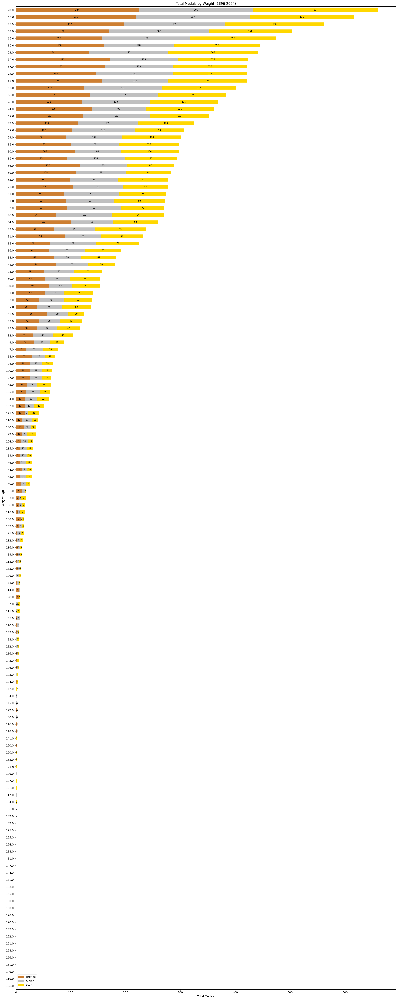

In [ ]:
# Group by 'Weight' and sum the medal counts
weight_medal_counts = backup1.groupby('Weight')[['Gold', 'Silver', 'Bronze']].sum()

# Calculate the total medals for sorting
weight_medal_counts['Total'] = weight_medal_counts['Gold'] + weight_medal_counts['Silver'] + weight_medal_counts['Bronze']

# Sort the medal counts in ascending order by total medal count
weight_medal_counts = weight_medal_counts.sort_values(by='Total', ascending=False)

# Plot the horizontal bar graph
fig, ax = plt.subplots(figsize=(20, 50))

# Plot each medal type
weight_medal_counts[['Bronze', 'Silver', 'Gold']].plot(kind='barh', stacked=True, color=['#cd7f32', '#c0c0c0', '#ffd700'], ax=ax)

# Set labels and title
ax.set_xlabel('Total Medals')
ax.set_ylabel('Weight (kg)')
ax.set_title('Total Medals by Weight (1896-2024)')

# Display the total medal count on the bars
for i in ax.patches:
    # Find the position for the text
    width = i.get_width()
    if width > 0:  # Only display text for non-zero values
        ax.text(i.get_x() + width / 2, i.get_y() + i.get_height() / 2, str(int(width)),
                fontsize=8, color='black', va='center', ha='center')

# Adjust layout to prevent label overlap
plt.tight_layout()

# Invert the y-axis to display the highest medal count at the top
ax.invert_yaxis()

# Show the plot
plt.show()

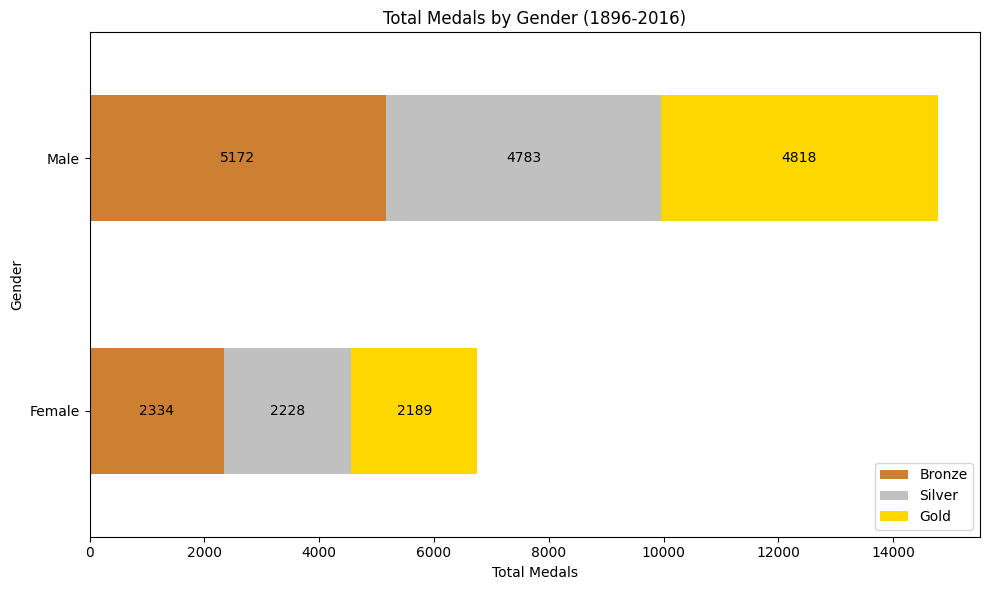

In [ ]:
# Group by 'Gender' and sum the medal counts
Gender_medal_counts = backup1.groupby('Gender')[['Gold', 'Silver', 'Bronze']].sum()

# Calculate the total medals for sorting
Gender_medal_counts['Total'] = Gender_medal_counts['Gold'] + Gender_medal_counts['Silver'] + Gender_medal_counts['Bronze']

# Sort the medal counts in descending order by total medals
Gender_medal_counts = Gender_medal_counts.sort_values(by='Total', ascending=False)

# Plot the horizontal bar graph
fig, ax = plt.subplots(figsize=(10, 6))

# Plot each medal type
Gender_medal_counts[['Bronze', 'Silver', 'Gold']].plot(kind='barh', stacked=True, color=['#cd7f32', '#c0c0c0', '#ffd700'], ax=ax)

# Set labels and title
ax.set_xlabel('Total Medals')
ax.set_ylabel('Gender')
ax.set_title('Total Medals by Gender (1896-2016)')

# Display the total medal count on the bars
for i in ax.patches:
    # Find the position for the text
    width = i.get_width()
    if width > 0:  # Only display text for non-zero values
        ax.text(i.get_x() + width / 2, i.get_y() + i.get_height() / 2, str(int(width)),
                fontsize=10, color='black', va='center', ha='center')

# Adjust layout to prevent label overlap
plt.tight_layout()

# Invert the y-axis to display the highest medal count at the top
ax.invert_yaxis()

# Show the plot
plt.show()

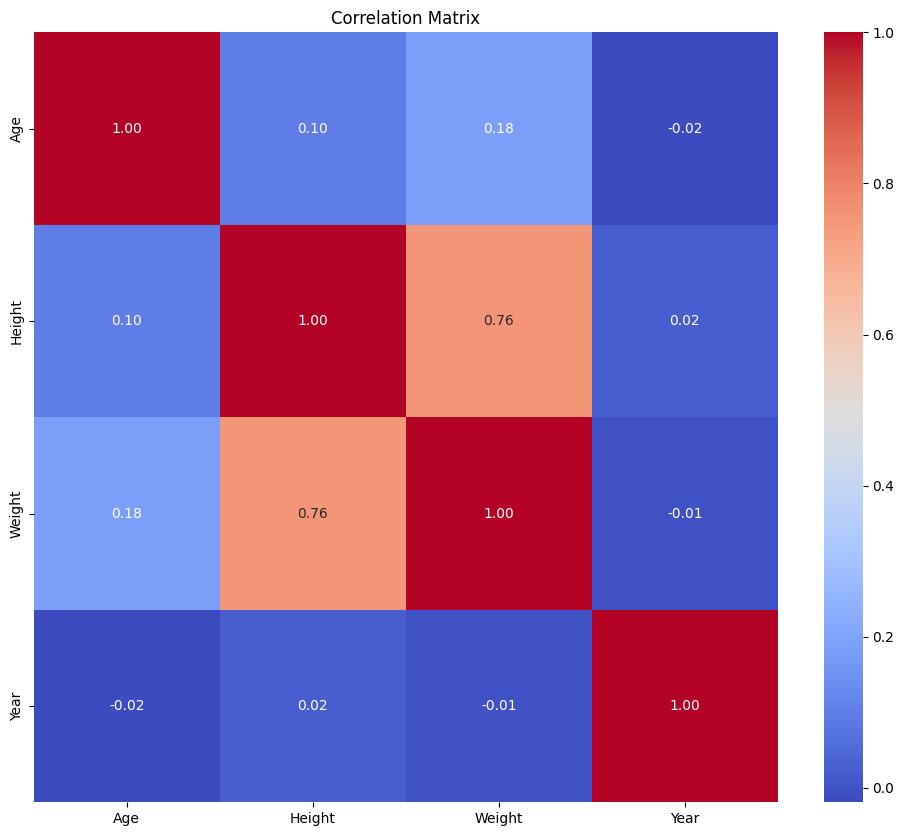

In [ ]:
# prompt: Print a correlation heatmap for backup1

import matplotlib.pyplot as plt
import numpy as np
# Select numerical columns for correlation analysis
numerical_cols = backup1.select_dtypes(include=np.number)

# Calculate the correlation matrix
correlation_matrix = numerical_cols.corr()

# Create a heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()
